In [1]:
import json
import os
from pathlib import Path

import numpy as np
import pandas as pd
import polars as pl
from matplotlib import pyplot as plt

In [2]:
pd.options.display.precision = 4

style_path = os.environ["MPL_STYLE"]
print("matplotlib style:", style_path)
plt.style.use(style_path)

color_cycle = plt.rcParams["axes.prop_cycle"].by_key()["color"]

PLOTW, _ = plt.rcParams["figure.figsize"]
FORMAT = plt.rcParams["savefig.format"]
print(PLOTW, FORMAT)

matplotlib style: /home/aerkent/skarf-experiments/resources/clane.mplstyle
3.42 png


In [3]:
project_root = Path(os.environ["PROJECT_ROOT"])

# Aggregated parquet file with all matrices
parquet_path = "/srv/projects/skarf/data_aggregation/hcp_1200_rfmri_schaefer.parquet"

# Output path for symmetry lookup
output_path = project_root / "resources/matrix_symmetry_lookup.json"

print(f"Parquet path: {parquet_path}")
print(f"Output path: {output_path}")

Parquet path: /srv/projects/skarf/data_aggregation/hcp_1200_rfmri_schaefer.parquet
Output path: /home/aerkent/skarf-experiments/resources/matrix_symmetry_lookup.json


## Load and explore data

In [4]:
# Load parquet file lazily
df = pl.scan_parquet(parquet_path)

# Get schema
print("Schema:")
print(df.schema)

# Get basic info
print("\nBasic info:")
print(df.select([pl.col("method").n_unique(), pl.col("func").n_unique(), pl.len()]).collect())

Schema:
Schema([('method', String), ('func_id', Int32), ('sub_id', Int32), ('func', String), ('sub', String), ('ses', UInt8), ('run', UInt8), ('success', Boolean), ('run_time', Float32), ('peak_mem_mb', Float32), ('err', String), ('mat', List(Float32)), ('train_score', Float32), ('val_score', Float32), ('test_score', Float32), ('scores', List(Float32)), ('lag', Int64)])

Basic info:
shape: (1, 3)
┌────────┬──────┬────────┐
│ method ┆ func ┆ len    │
│ ---    ┆ ---  ┆ ---    │
│ u32    ┆ u32  ┆ u32    │
╞════════╪══════╪════════╡
│ 2      ┆ 161  ┆ 596532 │
└────────┴──────┴────────┘


/tmp/ipykernel_144856/1692640575.py:6: PerformanceWarning: Resolving the schema of a LazyFrame is a potentially expensive operation. Use `LazyFrame.collect_schema()` to get the schema without this warning.
  print(df.schema)


In [5]:
# Get list of all method/func combinations
method_func_list = (
    df.select(["method", "func"])
    .unique()
    .sort(["method", "func"])
    .collect()
)

print(f"Total method/func combinations: {len(method_func_list)}")
print("\nFirst 10:")
print(method_func_list.head(10))

Total method/func combinations: 161

First 10:
shape: (10, 2)
┌────────┬─────────────────────────────────┐
│ method ┆ func                            │
│ ---    ┆ ---                             │
│ str    ┆ str                             │
╞════════╪═════════════════════════════════╡
│ pyspi  ┆ bary_euclidean_max              │
│ pyspi  ┆ bary_euclidean_mean             │
│ pyspi  ┆ ce_gaussian                     │
│ pyspi  ┆ ce_kernel_W-0.5                 │
│ pyspi  ┆ cohmag_multitaper_max_fs-1_fmi… │
│ pyspi  ┆ cohmag_multitaper_max_fs-1_fmi… │
│ pyspi  ┆ cohmag_multitaper_max_fs-1_fmi… │
│ pyspi  ┆ cohmag_multitaper_mean_fs-1_fm… │
│ pyspi  ┆ cohmag_multitaper_mean_fs-1_fm… │
│ pyspi  ┆ cohmag_multitaper_mean_fs-1_fm… │
└────────┴─────────────────────────────────┘


## Check symmetry for each method/func

In [ ]:
def is_matrix_symmetric(mat, rtol=1e-5, atol=1e-8):
    """
    Check if a matrix is symmetric.
    
    Parameters
    ----------
    mat : np.ndarray
        Matrix to check (flattened or 2D)
    rtol : float
        Relative tolerance for np.allclose
    atol : float
        Absolute tolerance for np.allclose
    
    Returns
    -------
    bool
        True if matrix is symmetric
    """
    # Handle flattened matrices
    if mat.ndim == 1:
        # Assume square matrix, compute dimension
        n = int(np.sqrt(len(mat)))
        if n * n != len(mat):
            raise ValueError(f"Cannot reshape flattened array of length {len(mat)} to square matrix")
        mat = mat.reshape(n, n)
    
    # Check symmetry, allowing NaN values on diagonal
    return np.allclose(mat, mat.T, rtol=rtol, atol=atol, equal_nan=True)


def check_method_symmetry(method, func, df, n_samples=10, seed=42):
    """
    Check if a method/func combination produces symmetric matrices.
    
    Parameters
    ----------
    method : str
        Method name ("pyspi" or "skarf")
    func : str
        Function name
    df : pl.LazyFrame
        Polars LazyFrame with matrix data
    n_samples : int
        Number of samples to check
    seed : int
        Random seed for sampling
    
    Returns
    -------
    dict
        Dictionary with symmetry results
    """
    # Filter for this method/func and successful computations
    filtered = df.filter(
        (pl.col("method") == method) & 
        (pl.col("func") == func) & 
        (pl.col("success") == True)
    )
    
    samples = filtered.select(["mat"]).limit(n_samples).collect()
    
    if len(samples) == 0:
        return {
            "method": method,
            "func": func,
            "is_symmetric": None,
            "n_samples": 0,
            "n_symmetric": 0,
            "consistency": 0.0,
            "n_errors": 0,
            "error": "No successful samples found"
        }
    
    # Check symmetry for each sample
    symmetry_results = []
    errors = []
    for i, mat in enumerate(samples["mat"]):
        mat_array = np.array(mat)
        try:
            is_sym = is_matrix_symmetric(mat_array)
            symmetry_results.append(is_sym)
        except Exception as e:
            errors.append(f"Sample {i}: {type(e).__name__}: {str(e)}")
    
    n_symmetric = sum(symmetry_results)
    n_checked = len(symmetry_results)
    n_errors = len(errors)
    
    # Only compute consistency for successfully checked samples
    consistency = n_symmetric / n_checked if n_checked > 0 else 0.0
    
    # Consider symmetric only if ALL successfully checked samples are symmetric
    # If there were errors, is_symmetric will be None
    if n_errors > 0:
        is_symmetric = None
    else:
        is_symmetric = consistency == 1.0
    
    result = {
        "method": method,
        "func": func,
        "is_symmetric": is_symmetric,
        "n_samples": len(samples),
        "n_symmetric": n_symmetric,
        "consistency": consistency,
        "n_errors": n_errors,
    }
    
    if errors:
        result["error_messages"] = errors
    
    return result


In [7]:
# Check symmetry for all method/func combinations
print("Checking symmetry for all method/func combinations...")
print("This may take a few minutes...\n")

symmetry_results = []
for row in method_func_list.iter_rows(named=True):
    method = row["method"]
    func = row["func"]
    
    result = check_method_symmetry(method, func, df, n_samples=20)
    symmetry_results.append(result)
    
    # Print progress every 20 methods
    if len(symmetry_results) % 20 == 0:
        print(f"Processed {len(symmetry_results)}/{len(method_func_list)} combinations...")

print(f"\nCompleted! Processed {len(symmetry_results)} combinations.")

Checking symmetry for all method/func combinations...
This may take a few minutes...

Processed 20/161 combinations...
Processed 40/161 combinations...
Processed 60/161 combinations...
Processed 80/161 combinations...
Processed 100/161 combinations...
Processed 120/161 combinations...
Processed 140/161 combinations...
Processed 160/161 combinations...

Completed! Processed 161 combinations.


In [8]:
# Convert to DataFrame
symmetry_df = pd.DataFrame(symmetry_results)

print(f"Total combinations: {len(symmetry_df)}")
print(f"Symmetric: {symmetry_df['is_symmetric'].sum()}")
print(f"Non-symmetric: {(~symmetry_df['is_symmetric']).sum()}")
print(f"Failed checks: {symmetry_df['is_symmetric'].isna().sum()}")

symmetry_df.head(20)

Total combinations: 161
Symmetric: 103
Non-symmetric: 58
Failed checks: 0


,method,func,is_symmetric,n_samples,n_symmetric,consistency,n_errors
0,pyspi,bary_euclidean_max,True,20,20,1.0,0
1,pyspi,bary_euclidean_mean,True,20,20,1.0,0
2,pyspi,ce_gaussian,True,20,20,1.0,0
3,pyspi,ce_kernel_W-0.5,False,20,0,0.0,0
4,pyspi,cohmag_multitaper_max_fs-1_fmin-0-25_fmax-0-5,True,20,20,1.0,0
5,pyspi,cohmag_multitaper_max_fs-1_fmin-0_fmax-0-25,True,20,20,1.0,0
6,pyspi,cohmag_multitaper_max_fs-1_fmin-0_fmax-0-5,True,20,20,1.0,0
7,pyspi,cohmag_multitaper_mean_fs-1_fmin-0-25_fmax-0-5,True,20,20,1.0,0
8,pyspi,cohmag_multitaper_mean_fs-1_fmin-0_fmax-0-25,True,20,20,1.0,0
9,pyspi,cohmag_multitaper_mean_fs-1_fmin-0_fmax-0-5,True,20,20,1.0,0


## Analyze results

In [22]:
# Check for inconsistent symmetry
inconsistent = symmetry_df[(symmetry_df['consistency'] > 0) & (symmetry_df['consistency'] < 1.0)]

if len(inconsistent) > 0:
    print("WARNING: Found methods with inconsistent symmetry!")
    print(inconsistent[['method', 'func', 'n_samples', 'n_symmetric', 'consistency']])
else:
    print("All methods have consistent symmetry across samples")

All methods have consistent symmetry across samples


In [23]:
# Check for methods with errors during symmetry checking
error_methods = symmetry_df[symmetry_df['n_errors'] > 0]

if len(error_methods) > 0:
    print("WARNING: Found methods with errors during symmetry checking!")
    print(error_methods[['method', 'func', 'n_samples', 'n_errors', 'consistency']])
    print("\nError details:")
    for _, row in error_methods.iterrows():
        if 'error_messages' in row and row['error_messages']:
            print(f"\n{row['method']}__{row['func']}:")
            for err_msg in row['error_messages']:
                print(f"  {err_msg}")
else:
    print("No errors during symmetry checking")


No errors during symmetry checking


In [24]:
# Summary by method type
summary = symmetry_df.groupby(['method', 'is_symmetric']).size().unstack(fill_value=0)
print("Symmetry by method type:")
print(summary)

Symmetry by method type:
is_symmetric  False  True 
method                    
pyspi            46    103
skarf            12      0


In [14]:
# For PySPI, check by category
pyspi_symmetry = symmetry_df[symmetry_df['method'] == 'pyspi'].copy()

# Extract category
pyspi_symmetry['category'] = pyspi_symmetry['func'].str.split('_').str[0]

print("\nPySPI symmetry by category:")
category_summary = pyspi_symmetry.groupby(['category', 'is_symmetric']).size().unstack(fill_value=0)
print(category_summary)

print("\nPySPI categories with ALL symmetric:")
# Check if True column exists, otherwise create empty list
if True in category_summary.columns:
    all_symmetric = category_summary[
        (category_summary[True] > 0) & (category_summary.get(False, pd.Series(0, index=category_summary.index)) == 0)
    ].index.tolist()
else:
    all_symmetric = []
print(all_symmetric)

print("\nPySPI categories with ALL non-symmetric:")
# Check if False column exists, otherwise create empty list
if False in category_summary.columns:
    all_nonsymmetric = category_summary[
        (category_summary[False] > 0) & (category_summary.get(True, pd.Series(0, index=category_summary.index)) == 0)
    ].index.tolist()
else:
    all_nonsymmetric = []
print(all_nonsymmetric)

print("\nPySPI categories with MIXED symmetry:")
# Check if both columns exist
if True in category_summary.columns and False in category_summary.columns:
    mixed = category_summary[
        (category_summary[True] > 0) & (category_summary[False] > 0)
    ].index.tolist()
else:
    mixed = []
print(mixed)



PySPI symmetry by category:
is_symmetric  False  True 
category                  
bary              0      2
ce                1      1
cohmag            0      6
coint             0     11
cov               0      7
dcorr             0      2
dspli             0      6
dswpli            0      6
dtw               0      2
gc                1      0
gd                3      0
gwtau             0      1
icoh              0      6
je                0      3
kendalltau        0      1
lcss              0      2
lmfit             1      4
mi                0      2
pdist             0      6
pec               0      6
phase             6      0
pli               6      0
plv               0      6
ppc               0      6
prec              0      7
psi               3      6
reci              1      0
sgc              12      0
spearmanr         0      1
te                3      0
tlmi              3      0
wpli              6      0
xcorr             0      3

PySPI categories with ALL

## Visualize results

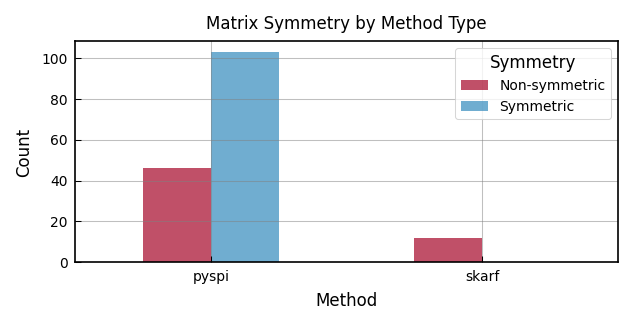

In [15]:
# Bar plot of symmetry by method
f, ax = plt.subplots(1, 1, figsize=(1.2 * PLOTW, 0.6 * PLOTW), layout="constrained")

summary_plot = symmetry_df.groupby(['method', 'is_symmetric']).size().unstack(fill_value=0)
summary_plot.plot(kind='bar', ax=ax, color=[color_cycle[1], color_cycle[0]], alpha=0.7)

ax.set_xlabel('Method', fontsize='medium')
ax.set_ylabel('Count', fontsize='medium')
ax.set_title('Matrix Symmetry by Method Type', fontsize='medium')
ax.legend(['Non-symmetric', 'Symmetric'], title='Symmetry')
ax.set_xticklabels(ax.get_xticklabels(), rotation=0)

f.savefig(project_root / f"output/matrix_symmetry_by_method.{FORMAT}", bbox_inches="tight")
plt.show()

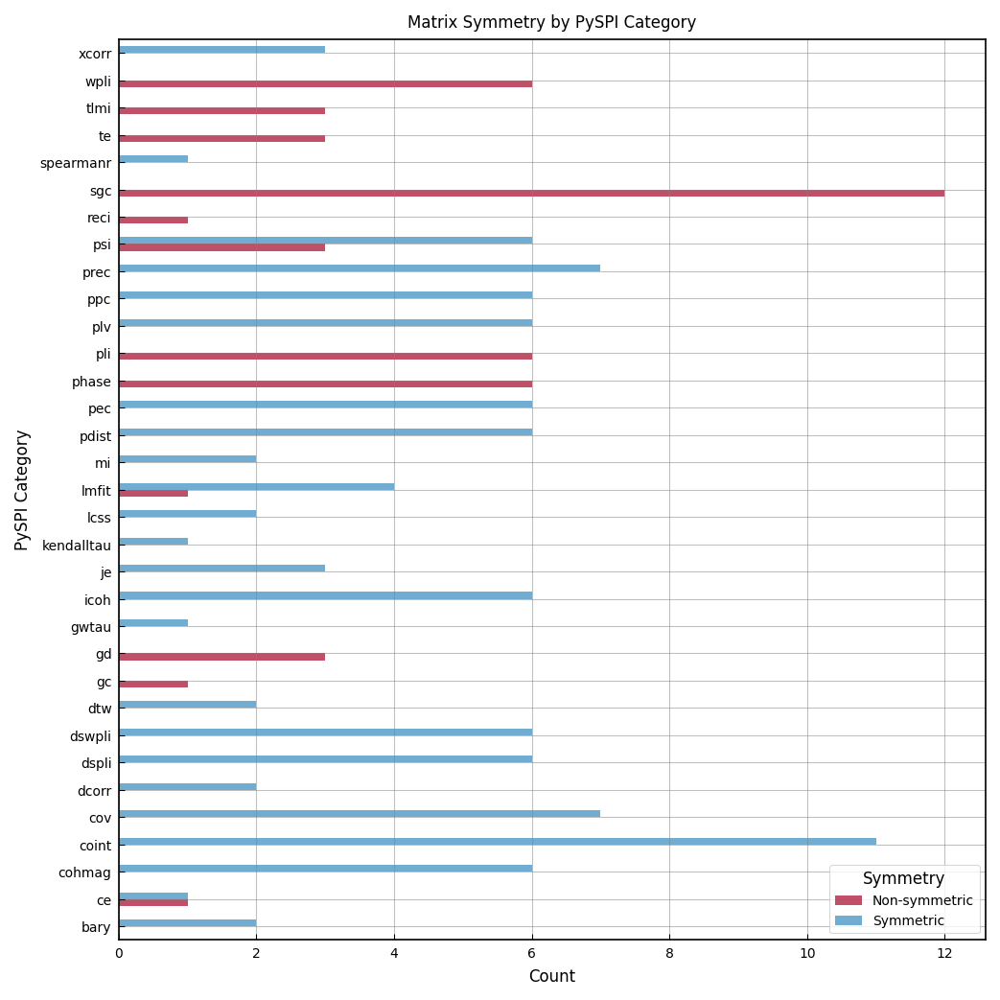

In [16]:
# Bar plot of PySPI symmetry by category
f, ax = plt.subplots(1, 1, figsize=(2 * PLOTW, 2 * PLOTW), layout="constrained")

category_summary.plot(kind='barh', ax=ax, color=[color_cycle[1], color_cycle[0]], alpha=0.7)

ax.set_ylabel('PySPI Category', fontsize='medium')
ax.set_xlabel('Count', fontsize='medium')
ax.set_title('Matrix Symmetry by PySPI Category', fontsize='medium')
ax.legend(['Non-symmetric', 'Symmetric'], title='Symmetry', loc='lower right')

f.savefig(project_root / f"output/matrix_symmetry_pyspi_categories.{FORMAT}", bbox_inches="tight")
plt.show()

Loading sample matrices from mixed symmetry categories...


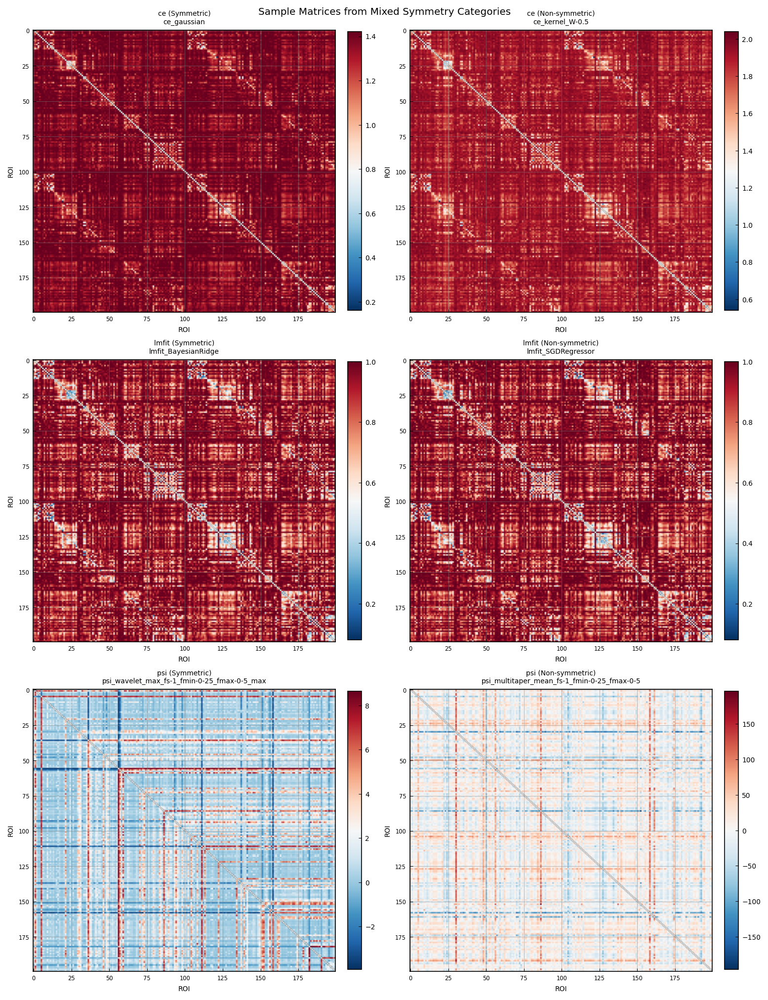

In [17]:
# Visualize sample matrices from mixed symmetry categories
print("Loading sample matrices from mixed symmetry categories...")

mixed_categories = mixed
n_categories = len(mixed_categories)

if n_categories > 0:
    # For mixed categories, show both symmetric and non-symmetric examples
    n_cols = 2  # One symmetric, one non-symmetric per category
    n_rows = n_categories
    
    f, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 1.5 * PLOTW, n_rows * 1.3 * PLOTW), 
                           layout="constrained")
    if n_categories == 1:
        axes = axes.reshape(1, -1)
    
    for row_idx, category in enumerate(mixed_categories):
        # Get symmetric and non-symmetric functions from this category
        cat_funcs = pyspi_symmetry[pyspi_symmetry['category'] == category]
        sym_funcs = cat_funcs[cat_funcs['is_symmetric'] == True]
        nonsym_funcs = cat_funcs[cat_funcs['is_symmetric'] == False]
        
        # Plot symmetric example
        ax_sym = axes[row_idx, 0]
        if len(sym_funcs) > 0:
            func_name = sym_funcs['func'].iloc[0]
            sample = df.filter(
                (pl.col("method") == "pyspi") & 
                (pl.col("func") == func_name) & 
                (pl.col("success") == True)
            ).select(["mat"]).limit(1).collect()
            
            if len(sample) > 0:
                mat = np.array(sample["mat"][0])
                n = int(np.sqrt(len(mat)))
                mat = mat.reshape(n, n)
                
                im = ax_sym.imshow(mat, cmap='RdBu_r', aspect='auto')
                ax_sym.set_title(f'{category} (Symmetric)\n{func_name}', fontsize='small')
                ax_sym.set_xlabel('ROI', fontsize='small')
                ax_sym.set_ylabel('ROI', fontsize='small')
                ax_sym.tick_params(labelsize='x-small')
                plt.colorbar(im, ax=ax_sym, fraction=0.046, pad=0.04)
        else:
            ax_sym.axis('off')
        
        # Plot non-symmetric example
        ax_nonsym = axes[row_idx, 1]
        if len(nonsym_funcs) > 0:
            func_name = nonsym_funcs['func'].iloc[0]
            sample = df.filter(
                (pl.col("method") == "pyspi") & 
                (pl.col("func") == func_name) & 
                (pl.col("success") == True)
            ).select(["mat"]).limit(1).collect()
            
            if len(sample) > 0:
                mat = np.array(sample["mat"][0])
                n = int(np.sqrt(len(mat)))
                mat = mat.reshape(n, n)
                
                im = ax_nonsym.imshow(mat, cmap='RdBu_r', aspect='auto')
                ax_nonsym.set_title(f'{category} (Non-symmetric)\n{func_name}', fontsize='small')
                ax_nonsym.set_xlabel('ROI', fontsize='small')
                ax_nonsym.set_ylabel('ROI', fontsize='small')
                ax_nonsym.tick_params(labelsize='x-small')
                plt.colorbar(im, ax=ax_nonsym, fraction=0.046, pad=0.04)
        else:
            ax_nonsym.axis('off')
    
    f.suptitle('Sample Matrices from Mixed Symmetry Categories', fontsize='large', y=1.0)
    f.savefig(project_root / f"output/matrix_symmetry_mixed_samples.{FORMAT}", 
              bbox_inches="tight", dpi=150)
    plt.show()
else:
    print("No mixed symmetry categories found.")


Loading sample matrices from non-symmetric categories...


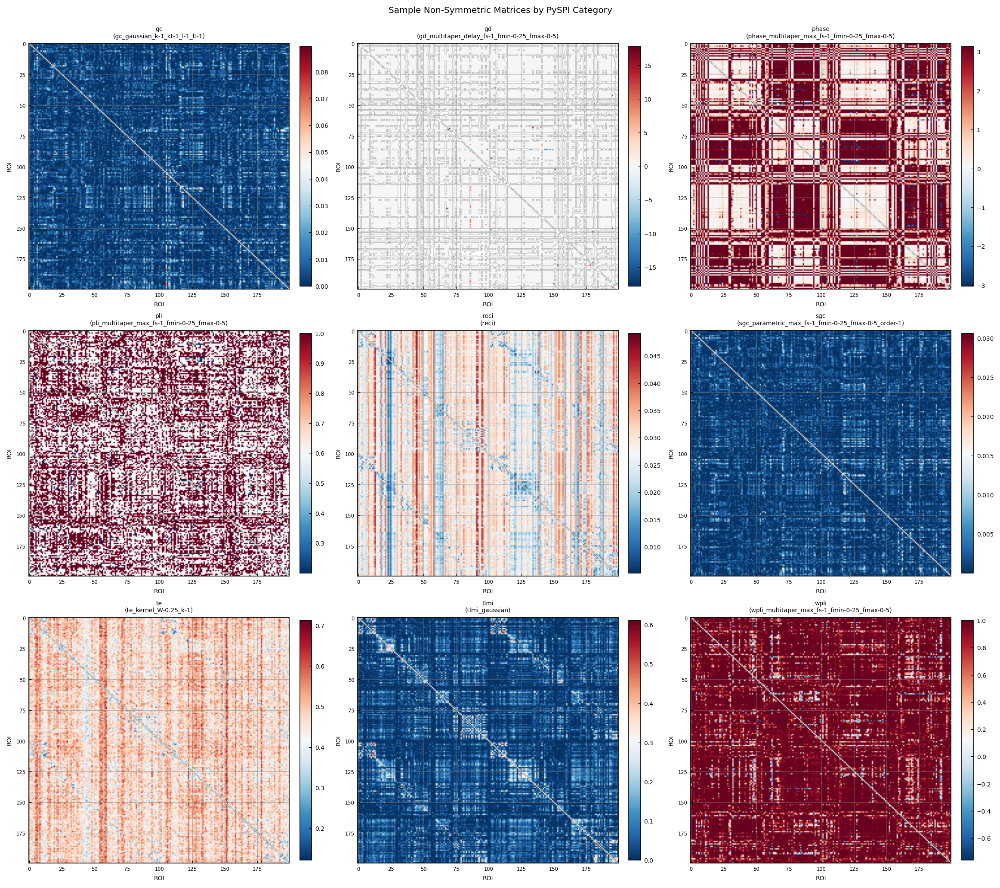

In [18]:
# Visualize sample matrices from non-symmetric categories
print("Loading sample matrices from non-symmetric categories...")

# Get one example from each non-symmetric category
nonsymmetric_categories = all_nonsymmetric
n_categories = len(nonsymmetric_categories)

if n_categories > 0:
    # Determine grid layout
    n_cols = 3
    n_rows = (n_categories + n_cols - 1) // n_cols
    
    f, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 1.5 * PLOTW, n_rows * 1.3 * PLOTW), 
                           layout="constrained")
    axes = axes.flatten() if n_categories > 1 else [axes]
    
    for idx, category in enumerate(nonsymmetric_categories):
        ax = axes[idx]
        
        # Get first function from this category
        funcs_in_cat = pyspi_symmetry[pyspi_symmetry['category'] == category]['func'].iloc[0]
        
        # Load one sample matrix
        sample = df.filter(
            (pl.col("method") == "pyspi") & 
            (pl.col("func") == funcs_in_cat) & 
            (pl.col("success") == True)
        ).select(["mat"]).limit(1).collect()
        
        if len(sample) > 0:
            mat = np.array(sample["mat"][0])
            n = int(np.sqrt(len(mat)))
            mat = mat.reshape(n, n)
            
            # Plot matrix
            im = ax.imshow(mat, cmap='RdBu_r', aspect='auto')
            ax.set_title(f'{category}\n({funcs_in_cat})', fontsize='small')
            ax.set_xlabel('ROI', fontsize='small')
            ax.set_ylabel('ROI', fontsize='small')
            ax.tick_params(labelsize='x-small')
            
            # Add colorbar
            plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
        else:
            ax.text(0.5, 0.5, 'No data', ha='center', va='center', transform=ax.transAxes)
            ax.set_title(f'{category}', fontsize='small')
            ax.axis('off')
    
    # Hide unused subplots
    for idx in range(n_categories, len(axes)):
        axes[idx].axis('off')
    
    f.suptitle('Sample Non-Symmetric Matrices by PySPI Category', fontsize='large', y=1.02)
    f.savefig(project_root / f"output/matrix_symmetry_nonsymmetric_samples.{FORMAT}", 
              bbox_inches="tight", dpi=150)
    plt.show()
else:
    print("No non-symmetric categories found.")


## Create and save symmetry lookup

In [25]:
# Create lookup dictionary
# Format: {"method__func": is_symmetric}

symmetry_lookup = {}

for _, row in symmetry_df.iterrows():
    method = row['method']
    func = row['func']
    is_sym = row['is_symmetric']
    
    key = f"{method}__{func}"
    symmetry_lookup[key] = bool(is_sym)

print(f"Created lookup with {len(symmetry_lookup)} entries")
print(f"Symmetric: {sum(symmetry_lookup.values())}")
print(f"Non-symmetric: {sum(not v for v in symmetry_lookup.values())}")

print("\nExample entries:")
for i, (key, value) in enumerate(list(symmetry_lookup.items())[:10]):
    print(f"  {key}: {value}")

Created lookup with 161 entries
Symmetric: 103
Non-symmetric: 58

Example entries:
  pyspi__bary_euclidean_max: True
  pyspi__bary_euclidean_mean: True
  pyspi__ce_gaussian: True
  pyspi__ce_kernel_W-0.5: False
  pyspi__cohmag_multitaper_max_fs-1_fmin-0-25_fmax-0-5: True
  pyspi__cohmag_multitaper_max_fs-1_fmin-0_fmax-0-25: True
  pyspi__cohmag_multitaper_max_fs-1_fmin-0_fmax-0-5: True
  pyspi__cohmag_multitaper_mean_fs-1_fmin-0-25_fmax-0-5: True
  pyspi__cohmag_multitaper_mean_fs-1_fmin-0_fmax-0-25: True
  pyspi__cohmag_multitaper_mean_fs-1_fmin-0_fmax-0-5: True


In [26]:
output_path.parent.mkdir(parents=True, exist_ok=True)

with open(output_path, 'w') as f:
    json.dump(symmetry_lookup, f, indent=2)

print(f"Saved symmetry lookup to: {output_path}")

Saved symmetry lookup to: /home/aerkent/skarf-experiments/resources/matrix_symmetry_lookup.json


In [27]:
csv_path = project_root / "output/matrix_symmetry_detailed.csv"
symmetry_df.to_csv(csv_path, index=False)
print(f"Saved detailed results to: {csv_path}")

Saved detailed results to: /home/aerkent/skarf-experiments/output/matrix_symmetry_detailed.csv
